# Exploratory data analysis-- total moth counts

What we are trying to do?

- For moth counts at each ECN moth trap (each site may have more than one trap), calculate daily rate of moth count. Then de-trend and de-seasonalize data (since we are not interested in seasonal variability) before applying a multi-sampling rate (MSR) changepoints algorithm to detect simultaneous changes in moth counts
- We also repeat the above for moth counts and weather data collected at sites.

In [1]:
## R script of useful functions for the moth/environment analysis
library(tidyverse)
library(dplyr)
library(lubridate)
library(ggplot2)
library(tibble)
library(readr)
library(feather)
library("changepoint.msr")

options(tibble.width = Inf)

text_size <- 16
text_tick_size <- 12
mytheme <- theme(
    #panel.background = element_rect(fill="white"),
    #panel.border = element_rect(colour = "light gray", fill=NA, size=1),
    text = element_text(size=text_size),
    axis.text.x = element_text(size=text_tick_size),
    axis.text.y = element_text(size=text_tick_size),
    #legend.position = c(1,0),
    #legend.justification=c(1,0),
    #legend.background = element_blank()
)

setwd("/data/notebooks/jupyterlab-workshop/")
#setwd("/home//lowther1/Downloads/Notebooks/")

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.0 ──

✔ ggplot2 3.3.2     ✔ purrr   0.3.4
✔ tibble  3.0.4     ✔ dplyr   1.0.2
✔ tidyr   1.1.2     ✔ stringr 1.4.0
✔ readr   1.3.1     ✔ forcats 0.5.0

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()


Attaching package: ‘lubridate’


The following objects are masked from ‘package:base’:

    date, intersect, setdiff, union


Successfully loaded changepoint.msr package version 0.0.2



Select sites to explore and data observation window

In [2]:
sites <- c(paste0("T0", 1:9), paste0("T", c(10,12)))
daterange <- c(
    "1950-01-01",
    "2021-01-01"
)

input.site <- list(
    sites = sites,# 11 ECN sites
    daterange = daterange # date range
)
input.site

$sites
 [1] "T01" "T02" "T03" "T04" "T05" "T06" "T07" "T08" "T09" "T10" "T12"

$daterange
[1] "1950-01-01" "2021-01-01"

Read and clean the data

In [3]:
getdata.moth <- function(input)
{
    # some of this code is taken from Michael T's functions
    
    # moth data
    mothdata <- tibble::as_tibble(read.csv("/data/ecn/ECN_IM1.csv"))
    #mothdata <- tibble::as_tibble(read.csv("ECN_IM1.csv"))
    
    # process
    dd = mothdata %>%
    # change year format yy to yyyy
    dplyr::mutate(YEAR=as.integer(str_sub(SDATE, start= -2))) %>%
    dplyr::mutate(YEAR=if_else( YEAR <= 50,YEAR+2000,YEAR+1900)) %>%
    dplyr::mutate(DATE= as.Date(SDATE, format= "%d-%b-%y")) %>%
    # drop YEAR and SDATE columns
    dplyr::select(-YEAR,-SDATE) %>%
    # filter by (selected) sites
    dplyr::filter(SITECODE %in% input$sites) %>%
    # get dates in specified date range
    dplyr::filter(
        as.Date(DATE) >= as.Date(input$daterange[1]) &
        as.Date(DATE) <= as.Date(input$daterange[2]) 
    ) %>%
    # remove rows with "Q" in FIELDNAME
    dplyr::filter(!str_detect(FIELDNAME, "Q"))
    
    return(dd)
}

data.moth <- getdata.moth(input.site)

print(data.moth, n=5)

# A tibble: 200,733 x 5
  SITECODE LCODE FIELDNAME VALUE DATE      
  <fct>    <int> <fct>     <int> <date>    
1 T06          2 2542          1 1992-02-24
2 T06          2 929           1 1992-02-24
3 T06          2 2542          1 1992-02-25
4 T06          2 929           1 1992-02-25
5 T06          2 907           1 1992-03-05
# … with 200,728 more rows


# Filter moth by species, where application


In [4]:
summer_moths <- c(80,191,331,623,96) # summer flying moths
interesting_moths <- c(180,864,444,148,382,717) # interesting moths
data.moth <- data.moth #%>% filter()

Plot of active LCODE's over each site.
 - Each LCODE represents the trap number for the given site.
 - The dots show data recorded from the LCODE
 - Note, FIELDNAME with Q removed (above) so there could be more days with sites operating more than one trap
 - Red dots indicate only one trap at site operating, blue means 2. 
 - Sites T04 and T06 have more than one trap operating at some times
 
Despite sites T02 and T10 apparently have no overlap between operating traps, we proceed by analysing data from each trap separetly. This is because each trap could be located at a different position within a site and these different positions could be more or less favourable to moths. 

`summarise()` regrouping output by 'SITECODE', 'LCODE' (override with `.groups` argument)



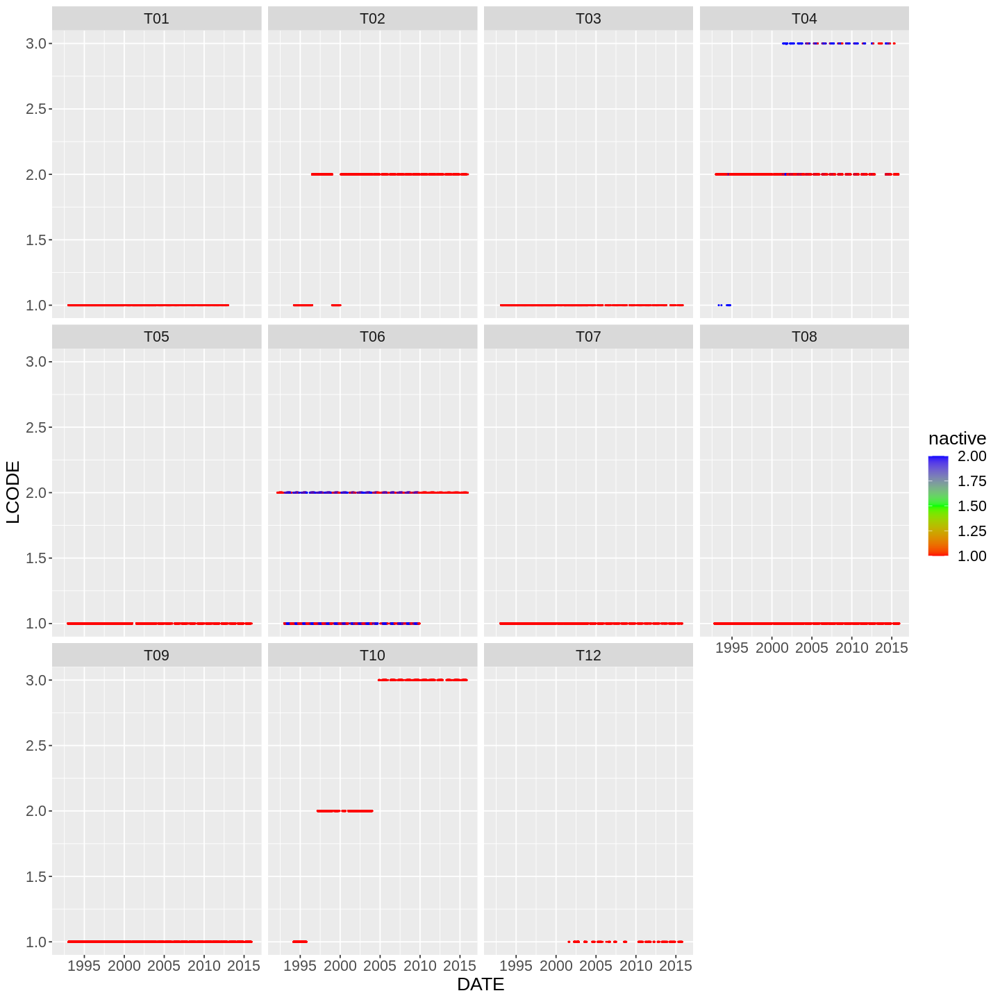

In [5]:
data.plot.lcode <- data.moth %>%
    # moth count by SITECODE, LCODE, DATE
    group_by(SITECODE, LCODE, DATE) %>%
    summarize(VALUE = sum(VALUE)) %>%
    ungroup() %>%
    # number of active traps
    group_by(SITECODE, DATE) %>%
    mutate(nactive = n()) %>%
    ungroup()

options(repr.plot.width = 12, repr.plot.height = 12)
plot.lcode <- data.plot.lcode %>%
    ggplot(aes(x = DATE, y = LCODE, color = nactive)) + 
    geom_point(size=0.2) +
    scale_color_gradientn(colours = rainbow(3)) +
    facet_wrap(SITECODE~.) +
    theme(text = element_text(size=16))
plot.lcode

The number of traps operating at the same time by site

In [6]:
data.plot.lcode %>%
    group_by(SITECODE) %>%
    summarize(max_operational = max(nactive))

`summarise()` ungrouping output (override with `.groups` argument)



SITECODE,max_operational
<fct>,<int>
T01,1
T02,1
T03,1
T04,2
T05,1
T06,2
T07,1
T08,1
T09,1


# Daily counts of all moths
- The data for the following traps, T02-1, T04-1, T04-3, T10-1, T10-2 and T12-1, is sparse. We will proceed without these traps.
- Hence, we proceed with the following traps, "T01-1", "T02-2", "T03-1", "T04-2", "T05-1", "T06-1", "T06-2", "T07-1", "T08-1", "T09-1", "T10-3".
- Moth counts are highest in the summer months (green). Much lower in Jan/Feb (red) and Nov/Dec (blue).

`summarise()` regrouping output by 'TRAPCODE' (override with `.groups` argument)



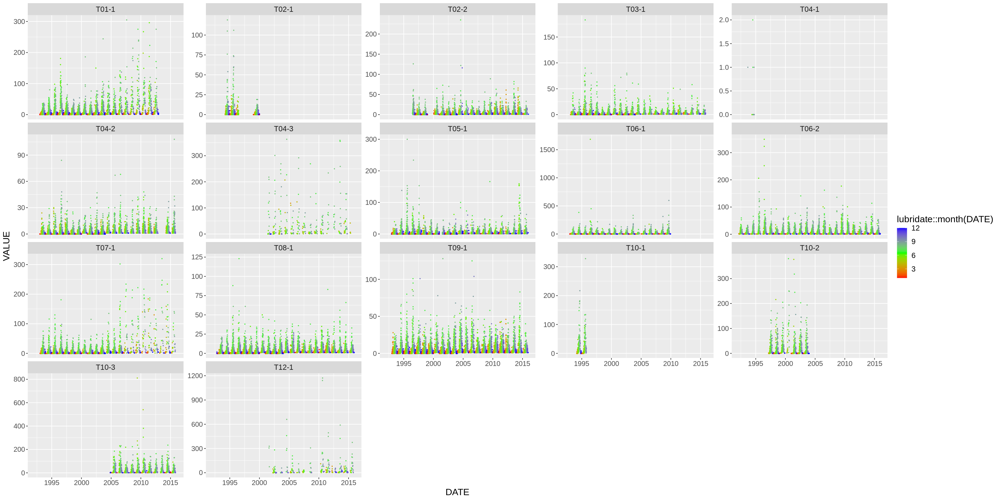

In [7]:
getdata.moth.dailycount <- function(input)
{
    data.moth <- getdata.moth(input)
    
    return(
        data.moth %>%
        # add TRAPCODE column
        mutate(
            TRAPCODE = paste0(SITECODE, "-", LCODE)
        ) %>%
        # Aggregate over FIELDNAME (count all moths)
        group_by(TRAPCODE, DATE) %>%
        summarize(VALUE = sum(VALUE)) %>%
        ungroup() %>%
        # add interval between observations
        group_by(TRAPCODE) %>%
        arrange(DATE) %>%
        mutate(interval = c(NA, diff(DATE))) %>%
        ungroup() %>%
        # remove rows with NA
        filter( !is.na(interval) )
    )
}
data.moth.dailycount <- getdata.moth.dailycount(input.site)

options(repr.plot.width = 24, repr.plot.height = 12)
plot.data.moth.dailycount <- data.moth.dailycount %>%
    ggplot(aes(x = DATE, y = VALUE, colour = lubridate::month(DATE))) +
    scale_color_gradientn(colours = rainbow(3)) +
    geom_point(size = 0.3) + 
    facet_wrap(
        TRAPCODE~.,
        scales = "free_y"
    ) + 
    mytheme
plot.data.moth.dailycount

# Summary of data
 - It is reasonable to adjust the counts by the number of days that pass between emptying. But, including and adjusting data for very large intervals may be misleading.
 - Determine a maximum interval threshold

In [8]:
summary.data.moth.dailycount <- data.moth.dailycount %>%
    group_by(TRAPCODE) %>%
    summarize(
        min.value = min(VALUE),
        max.value = max(VALUE),
        min.interval = min(interval),
        max.interval = max(interval)
    )
summary.data.moth.dailycount

`summarise()` ungrouping output (override with `.groups` argument)



TRAPCODE,min.value,max.value,min.interval,max.interval
<chr>,<int>,<int>,<dbl>,<dbl>
T01-1,0,305,1,57
T02-1,0,119,1,921
T02-2,0,235,1,393
T03-1,0,183,1,189
T04-1,0,2,1,247
T04-2,0,108,1,497
T04-3,0,363,1,308
T05-1,0,300,1,186
T06-1,0,1686,1,117


# Interval between traps emptied
  - There is some change in emptying freqeuency. Around 2004 the interval between traps being emptied appears to change, the time of change is highlighted by the solid (blue) vertical line
  - There is some disruption to emptying traps begining around the start of 2000. This may be related to the foot-and-mouth outbreak.
  - There are very large sampling intervals

`summarise()` regrouping output by 'TRAPCODE' (override with `.groups` argument)



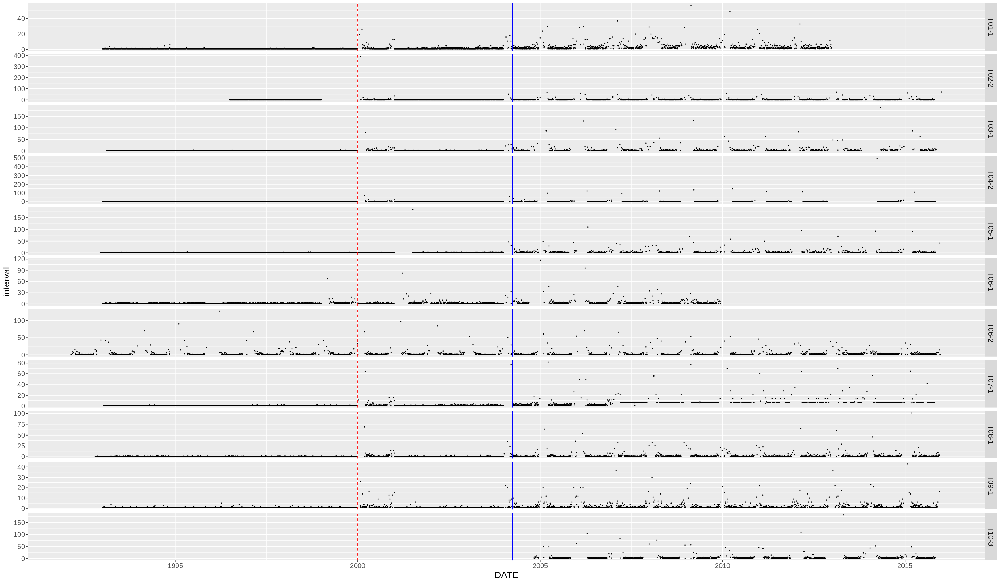

In [9]:
getdata.mothtrap.dailycount <- function(input)
{
    sites <- unique(do.call(c, lapply(input$traps, function(x){ strsplit(x, "-")[[1]][1]})))
    
    # read and clean moth data
    data.moth.dailycount <- getdata.moth.dailycount(
        list(
            daterange = input$daterange,
            sites = sites
        )
    )
    
    
    return(
        data.moth.dailycount %>%
        filter( TRAPCODE %in% input$traps )
    )
}
traps.selected <- c("T01-1", "T02-2", "T03-1", "T04-2", "T05-1", "T06-1", "T06-2", "T07-1", "T08-1", "T09-1", "T10-3")
#traps.selected <- c("T02-2", "T04-2", "T06-2", "T08-1")

input.traps <- list(
    daterange = daterange,
    traps = traps.selected
    )
data.mothtrap.dailycount <- getdata.mothtrap.dailycount(
    input.traps
)

options(repr.plot.width = 24, repr.plot.height = 14)
plot.data.mothtrap.interval <-  data.mothtrap.dailycount %>%
    # plot
    ggplot(aes(x = DATE, y = interval)) + 
    geom_point(size = 0.3) +
    geom_vline(
        data = data.frame(loc = as.Date(c("2004-04-01"))),
        aes(xintercept = loc),
        colour = "blue"
    ) + 
    geom_vline(
        data = data.frame(loc = as.Date(c("2000-01-01"))),
        aes(xintercept = loc),
        linetype = 2,
        colour = "red"
    ) + 
    scale_color_gradientn(colours = rainbow(3)) +
    facet_grid(
        #TRAPCODE ~ .,
        row = vars(TRAPCODE),
        #col = vars(VARIABLE),
        scales = "free_y"
    ) + 
    mytheme
plot.data.mothtrap.interval

# Interval threshold (above which we don't try to fill missing data)
Missing data can be seen as not emptying moths in moth traps on time. So in some cases we could average them.

 - Having a maximum interval of 5 days removes no more than 9% of observations for any trap
 - 8 out of 11 traps lose less than 4% of data
 - Most data removed is for winter months

`summarise()` regrouping output by 'TRAPCODE' (override with `.groups` argument)



thresholding interval. see summary table below

`summarise()` ungrouping output (override with `.groups` argument)



# A tibble: 11 x 14
   TRAPCODE n.obs min.value min.value.new max.value max.value.new min.interval
   <chr>    <int>     <int>         <int>     <int>         <int>        <dbl>
 1 T01-1     4598         0             0       305           296            1
 2 T02-2     4248         0             0       235           235            1
 3 T03-1     4124         0             0       183           183            1
 4 T04-2     5493         0             0       108           108            1
 5 T05-1     5072         0             0       300           300            1
 6 T06-1     3481         0             0      1686          1686            1
 7 T06-2     3741         1             1       349           349            1
 8 T07-1     4425         0             0       320           302            1
 9 T08-1     6026         0             0       123           123            1
10 T09-1     6574         0             0       128           125            1
11 T10-3     1257         1     

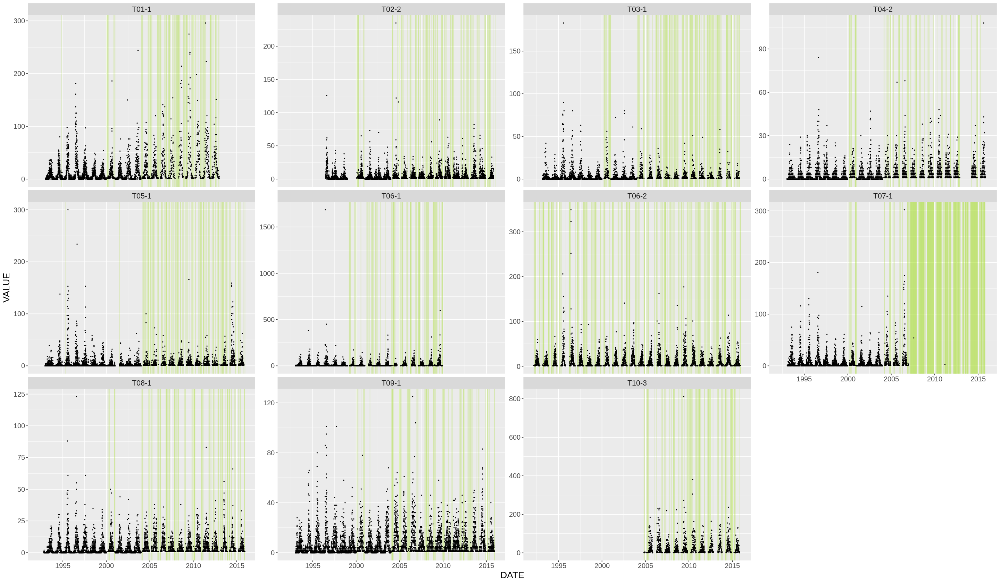

In [10]:
summary.threshold <- function(tbl, max)
{
    return(
        tbl %>%
        group_by(TRAPCODE) %>%
        summarize(
            n.obs = n(),
            min.value = min(VALUE),
            min.value.new = min(VALUE[interval <= max]),
            max.value = max(VALUE),
            max.value.new = max(VALUE[interval <= max]),
            min.interval = min(interval),
            min.interval.new = min(interval[interval <= max]),
            max.interval = max(interval),
            max.interval.new = max(interval[interval <= max]),
            n.kept = sum(interval <= max),
            n.removed = sum(interval > max),
            percent.kept = 100*n.kept/n.obs,
            percent.removed = 100*n.removed/n.obs
        ) %>%
        ungroup()
    )    
}

getdata.mothtrap.dailycount.threshold <- function(input)
{
    data.mothtrap.dailycount <- getdata.mothtrap.dailycount(input)
    
    message( "\n\nthresholding interval. see summary table below" )
    print( summary.threshold(data.mothtrap.dailycount, input$max.interval) )
    
    return(
        data.mothtrap.dailycount %>%
        filter(interval <= input$max.interval)
    )
}

max.interval <- 5
input.traps$max.interval <- max.interval

data.mothtrap.dailycount.threshold <- getdata.mothtrap.dailycount.threshold(
    input.traps
)

# plot values with interval less than threshold
plot.data.mothtrap.dailycount.threshold <- data.mothtrap.dailycount.threshold %>%
    ggplot(aes(x = DATE, y = VALUE)) + 
    # add vertical lines of data points removed
    geom_vline(
        data = data.mothtrap.dailycount %>% filter(interval > max.interval),
        aes(xintercept = DATE),
        linetype = 1,
        colour = "#a0dc22",
        alpha = 0.2
        ) +
    geom_point(size = 0.3) + 
    # faceting
    facet_wrap(
        TRAPCODE ~ .,
        scales = "free_y"
    ) + 
    mytheme
plot.data.mothtrap.dailycount.threshold

# How data changes amongst traps
  - A lot of data is visibly missing from site T07-1

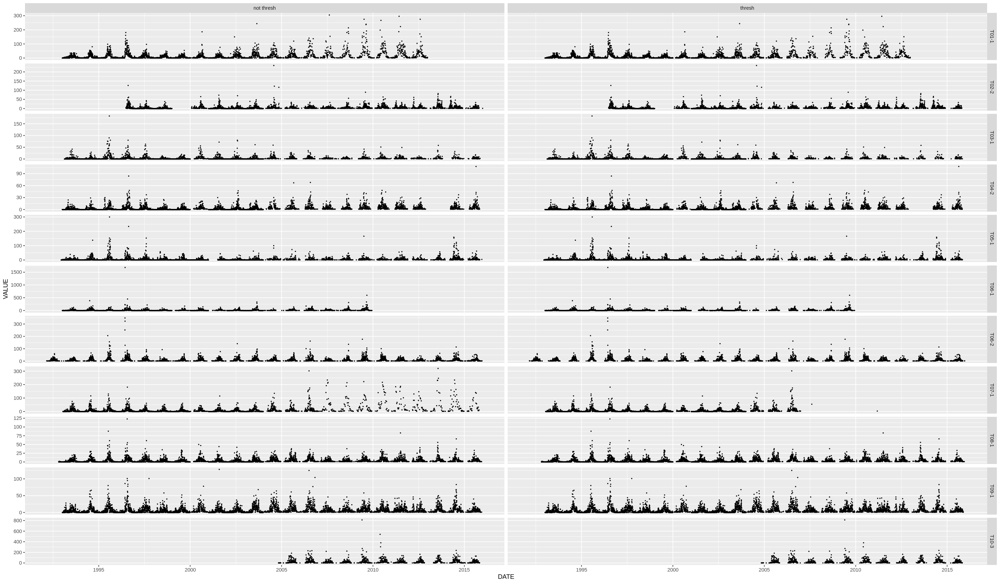

In [11]:
rbind( 
    data.mothtrap.dailycount.threshold %>% mutate(type = "thresh"),
    data.mothtrap.dailycount %>% mutate(type = "not thresh")
) %>%
ggplot( aes(x = DATE, y = VALUE) ) +
geom_point(size = 0.3) +
facet_grid(
    row = vars(TRAPCODE),
    col = vars(type),
    scales = "free_y"
)

# What time of year do we have data?

`summarise()` regrouping output by 'TRAPCODE' (override with `.groups` argument)



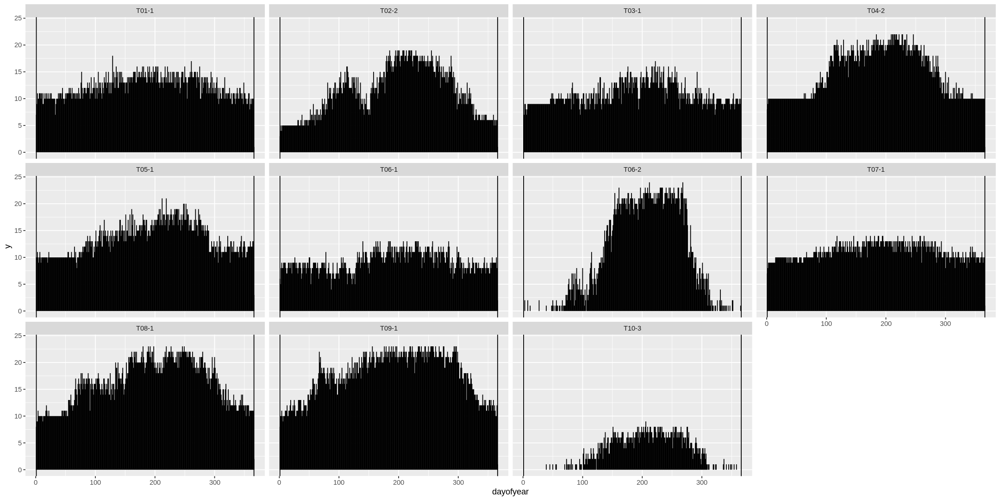

In [12]:
options(repr.plot.width = 18, repr.plot.height = 9)

data.mothtrap.dailycount %>% 
    filter(interval <= max.interval) %>%
    group_by(TRAPCODE, dayofyear = lubridate::yday(DATE)) %>%
    summarize(n = n()) %>%
    ungroup() %>%
    ggplot() +
    geom_segment(aes(x = dayofyear, xend = dayofyear, y = 0, yend = n)) +
    geom_vline( 
        data = data.frame(loc = c(1, 366)),
        aes(xintercept = loc)
    ) +
    facet_wrap( 
        TRAPCODE ~ . 
    )

# Daily moth rate
 - Moth rate, $R_t = \frac{C_t}{I_t}$, where $C_t$ is daily count and $I_t$ is the number of days since the last observation
 - Note that we have thresholded the values
 - The majority of high observation correspond to the intervals of 1 day (red points below).

In [13]:
getdata.mothtrap.dailyrate.threshold <- function(input)
{
    data.mothtrap.dailycount.threshold <- getdata.mothtrap.dailycount.threshold(input)
    
    return(
        data.mothtrap.dailycount.threshold %>%
        mutate(rate = VALUE/interval)
    )
}

data.mothtrap.dailyrate.threshold <- getdata.mothtrap.dailyrate.threshold(
    input.traps
)

print( data.mothtrap.dailyrate.threshold, n = 5 )

`summarise()` regrouping output by 'TRAPCODE' (override with `.groups` argument)



thresholding interval. see summary table below

`summarise()` ungrouping output (override with `.groups` argument)



# A tibble: 11 x 14
   TRAPCODE n.obs min.value min.value.new max.value max.value.new min.interval
   <chr>    <int>     <int>         <int>     <int>         <int>        <dbl>
 1 T01-1     4598         0             0       305           296            1
 2 T02-2     4248         0             0       235           235            1
 3 T03-1     4124         0             0       183           183            1
 4 T04-2     5493         0             0       108           108            1
 5 T05-1     5072         0             0       300           300            1
 6 T06-1     3481         0             0      1686          1686            1
 7 T06-2     3741         1             1       349           349            1
 8 T07-1     4425         0             0       320           302            1
 9 T08-1     6026         0             0       123           123            1
10 T09-1     6574         0             0       128           125            1
11 T10-3     1257         1     

# Comparing the count and rate

# A tibble: 47,480 x 5
  TRAPCODE DATE       VALUE interval  rate
  <chr>    <date>     <int>    <dbl> <dbl>
1 T06-2    1992-02-25     2        1   2  
2 T06-2    1992-03-09     2        4   0.5
3 T06-2    1992-04-07     1        5   0.2
4 T06-2    1992-04-09     1        2   0.5
5 T06-2    1992-04-20     4        1   4  
# … with 47,475 more rows


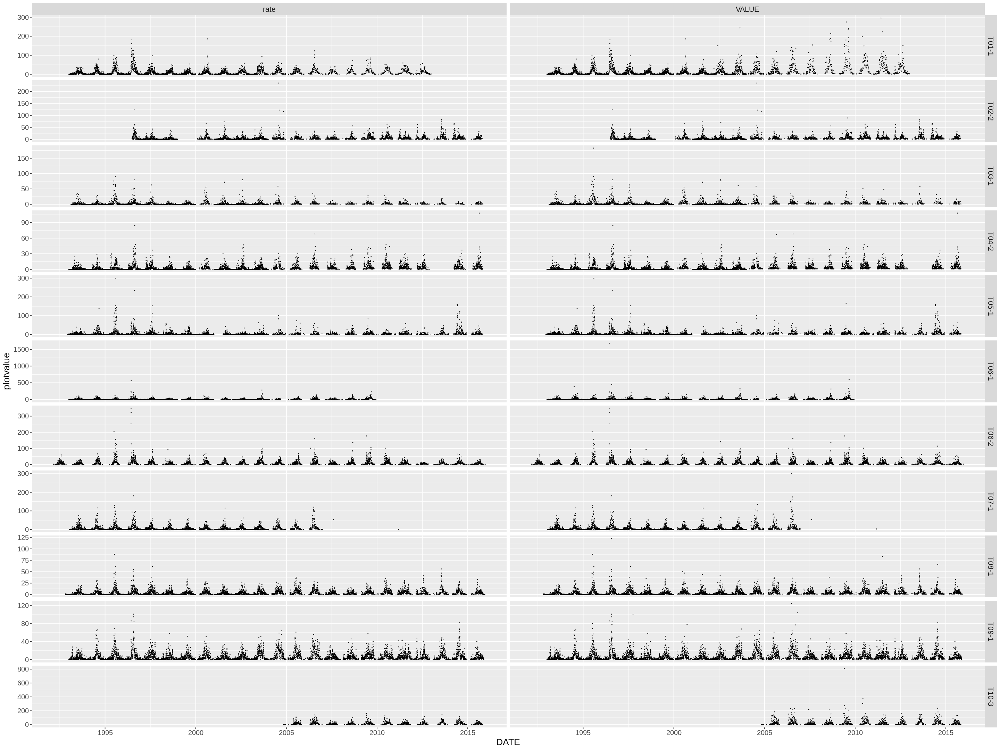

In [14]:
print( data.mothtrap.dailyrate.threshold, n = 5 )

options(repr.plot.width = 24, repr.plot.height = 18)
data.mothtrap.dailyrate.threshold %>%
tidyr::pivot_longer(
    cols = c(VALUE, rate),
    names_to = "type",
    values_to = "plotvalue"
) %>%
ggplot(aes(x = DATE, y = plotvalue)) +
geom_point(size = 0.1) +
facet_grid(
    row = vars(TRAPCODE),
    col = vars(type),
    scales = "free_y"
) + 
mytheme

# Daily rate

In [15]:
data.mothtrap.dailyrate.threshold

TRAPCODE,DATE,VALUE,interval,rate
<chr>,<date>,<int>,<dbl>,<dbl>
T06-2,1992-02-25,2,1,2.0
T06-2,1992-03-09,2,4,0.5
T06-2,1992-04-07,1,5,0.2
T06-2,1992-04-09,1,2,0.5
T06-2,1992-04-20,4,1,4.0
T06-2,1992-04-22,1,2,0.5
T06-2,1992-04-23,1,1,1.0
T06-2,1992-05-03,2,1,2.0
T06-2,1992-05-05,1,2,0.5


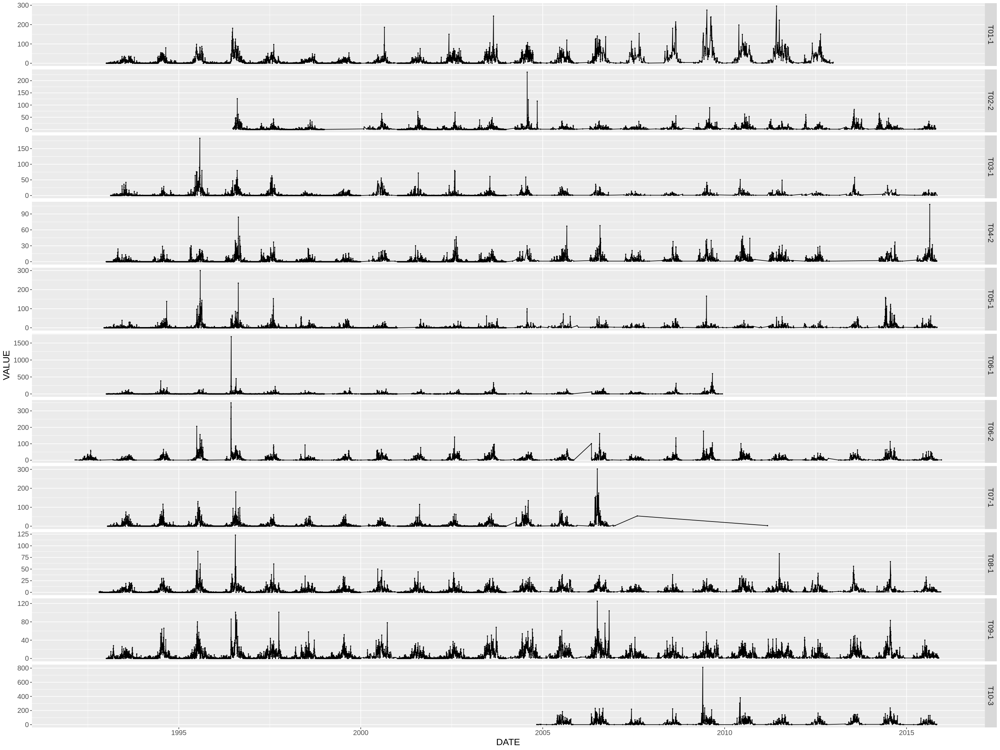

In [16]:
data.mothtrap.dailyrate.threshold %>%
    ggplot(aes(x = DATE, y = VALUE)) + 
    geom_point(size = 0.3) +
    geom_line() +
    facet_grid(
        row = vars(TRAPCODE),
        scales = "free_y"
    ) +
    mytheme

# Smooth rate
Lindsay made a great point regarding "changepoint analysis between traps", msr method assumes simultaneous changes, so what value does an across trap analysis provide, unless there is evidence to support a similarity
  - whilst there are some similarities across traps in behaviour
	- 93-96 year-on-year increase T01-1 
	- 93-95 increase, 96 decrease T04-2, T05-1, T07-1, T08-1, T09-1
	- Peak in 2006 T01-1, T04-2, T06-2, T07-1
  - There are some differences
	- Bi-modal in some years for example
		- T01-1: 93, 95
		- T08-1: 93, 01, 05, 06, 09
        
Finding evidence to explain such similarites or differences would be great. Weather variables may do this

Warning message:
“Removed 319 rows containing missing values (geom_point).”


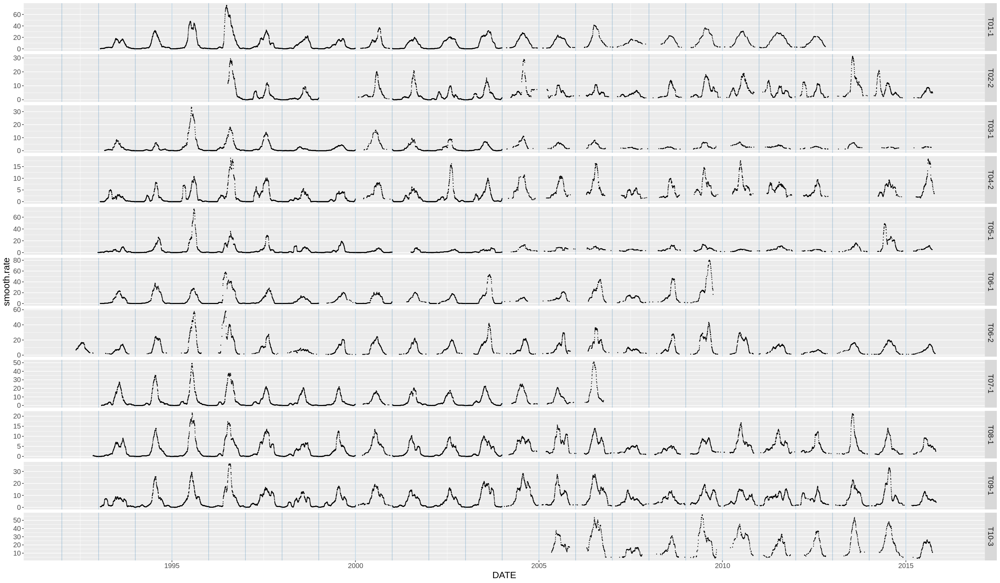

In [17]:
len.smoother <- 30

options(repr.plot.width = 24, repr.plot.height = 14)
plot.data <- data.mothtrap.dailyrate.threshold %>%
    group_by(TRAPCODE) %>%
    arrange(DATE) %>%
    mutate(
        smooth.rate = stats::filter(x = rate, filter = rep(1/len.smoother, len.smoother, method = "convolution")),
        diff.smooth.rate = c(NA, diff(smooth.rate))
    ) %>%
    ungroup() 

tbl.range.date <- plot.data %>% 
summarize(
    year.min = lubridate::year(min(DATE)), 
    year.max = lubridate::year(max(DATE))
) 

plot.data %>%
    ggplot(aes(x = DATE, y = smooth.rate)) +
    geom_point(size = 0.1) +
    #geom_line() +
    # add year lines
    geom_vline(
        data = data.frame(
            loc = seq(
                from = as.Date(paste0(tbl.range.date$year.min, "-01-01")), 
                to = as.Date(paste0(tbl.range.date$year.max, "-01-01")), 
                by = "1 year"
            )
        ),
        aes(xintercept = loc),
        colour = "#1f77b4",
        alpha = 0.3
    ) +
    # average smoothed value
#     geom_hline(
#         data = plot.data %>% group_by(TRAPCODE) %>% summarize(mean = mean(smooth.rate, na.rm=T)),
#         aes(yintercept = mean),
#         colour = "#1f77b4"
#     ) +
    facet_grid(
        row = vars(TRAPCODE),
        scales = "free_y"
    ) +
    mytheme

Warning message:
“Removed 330 rows containing missing values (geom_point).”


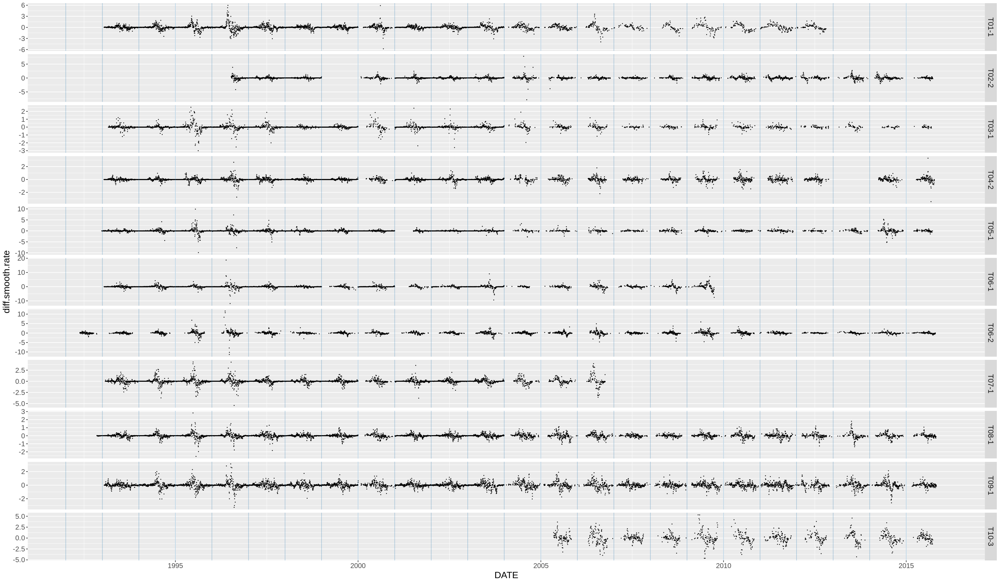

In [18]:
## plotting daily diff.smooth.rate

plot.data %>%
    ggplot(aes(x = DATE, y = diff.smooth.rate)) +
    geom_point(size = 0.1) +
    #geom_line() +
    # add year lines
    geom_vline(
        data = data.frame(
            loc = seq(
                from = as.Date(paste0(tbl.range.date$year.min, "-01-01")), 
                to = as.Date(paste0(tbl.range.date$year.max, "-01-01")), 
                by = "1 year"
            )
        ),
        aes(xintercept = loc),
        colour = "#1f77b4",
        alpha = 0.3
    ) +
    # average smoothed value
#     geom_hline(
#         data = plot.data %>% group_by(TRAPCODE) %>% summarize(mean = mean(smooth.rate, na.rm=T)),
#         aes(yintercept = mean),
#         colour = "#1f77b4"
#     ) +
    facet_grid(
        row = vars(TRAPCODE),
        scales = "free_y"
    ) +
    mytheme

In [21]:
saveRDS(plot.data, file = "plot.data.dailyrate.rds")
plot.data 

TRAPCODE,DATE,VALUE,interval,rate,smooth.rate,diff.smooth.rate
<chr>,<date>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
T06-2,1992-02-25,2,1,2.0,NA,NA
T06-2,1992-03-09,2,4,0.5,NA,NA
T06-2,1992-04-07,1,5,0.2,NA,NA
T06-2,1992-04-09,1,2,0.5,NA,NA
T06-2,1992-04-20,4,1,4.0,NA,NA
T06-2,1992-04-22,1,2,0.5,NA,NA
T06-2,1992-04-23,1,1,1.0,NA,NA
T06-2,1992-05-03,2,1,2.0,NA,NA
T06-2,1992-05-05,1,2,0.5,NA,NA


[1] "T01-1" "T02-2" "T03-1" "T04-2" "T05-1" "T06-1" "T06-2" "T07-1" "T08-1"
[10] "T09-1" "T10-3"

# Monthly moth rate

`summarise()` regrouping output by 'TRAPCODE', 'month' (override with `.groups` argument)



# A tibble: 2,312 x 5
  TRAPCODE month  year rate.monthly date      
  <chr>    <ord> <dbl>        <dbl> <date>    
1 T01-1    Jan    1993        0.25  1993-01-01
2 T01-1    Jan    1994        0.129 1994-01-01
3 T01-1    Jan    1995        0     1995-01-01
4 T01-1    Jan    1996        0.355 1996-01-01
5 T01-1    Jan    1997        0.258 1997-01-01
# … with 2,307 more rows


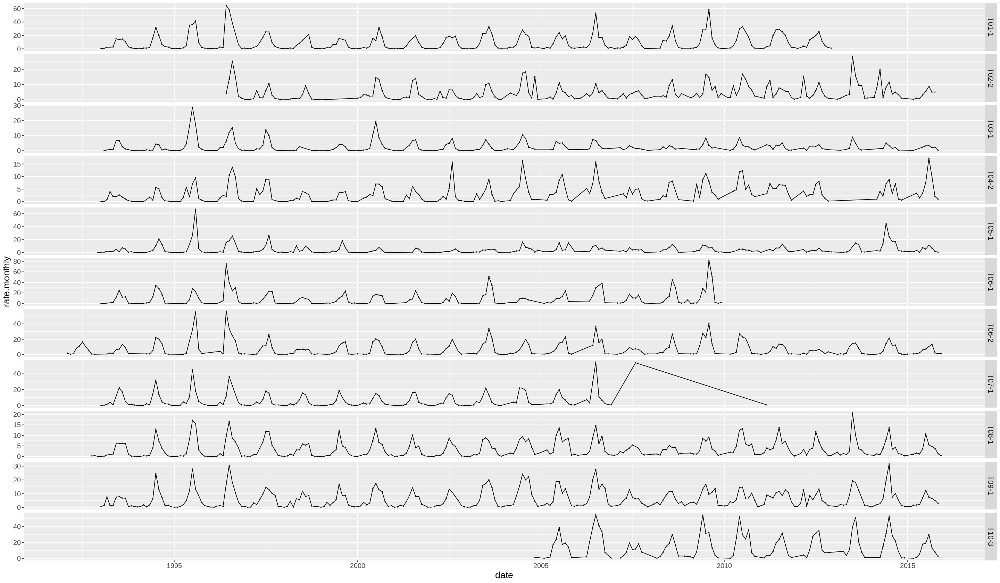

In [16]:
data.mothtrap.monthlyrate.threshold <- data.mothtrap.dailyrate.threshold %>%
    mutate(
        month = lubridate::month(DATE, label=T),
        year = lubridate::year(DATE)
    ) %>%
    group_by(TRAPCODE, month, year) %>%
    summarize(
        rate.monthly = mean(rate)
    ) %>%
    ungroup() %>%
    mutate(
        date = as.Date(paste0(year, "-", month, "-01"), "%Y-%B-%d")
    ) 
print( data.mothtrap.monthlyrate.threshold, n = 5 )

data.mothtrap.monthlyrate.threshold %>%
    # plot
    ggplot(aes(x = date, y = rate.monthly)) +
    geom_line() +
    geom_point(size = 0.3) +
    facet_grid(
        #col = vars(month),
        row = vars(TRAPCODE),
        scales = "free_y"
    ) +
    mytheme

# Monthly rate seasonal subseries plot

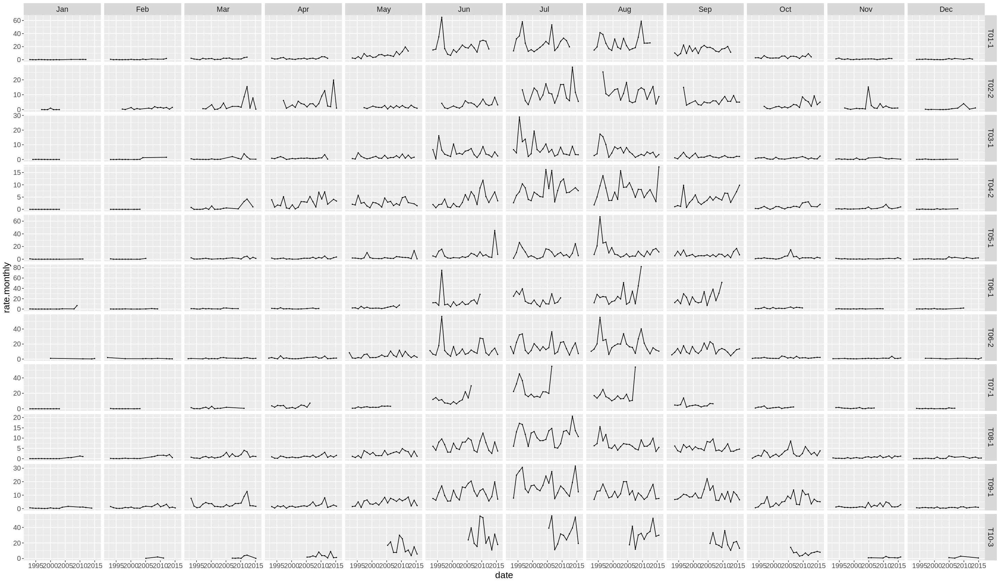

In [17]:
data.mothtrap.monthlyrate.threshold %>%
    ggplot(aes(x = date, y = rate.monthly)) +
    geom_point(size = 0.3) +
    geom_line() +
    facet_grid(
        row = vars(TRAPCODE),
        col = vars(month),
        scale = "free_y"
    ) +
    mytheme

# Deseasonalised, standardised monthly rate seasonal subseries plot

Warning message:
“Removed 11 rows containing missing values (geom_point).”


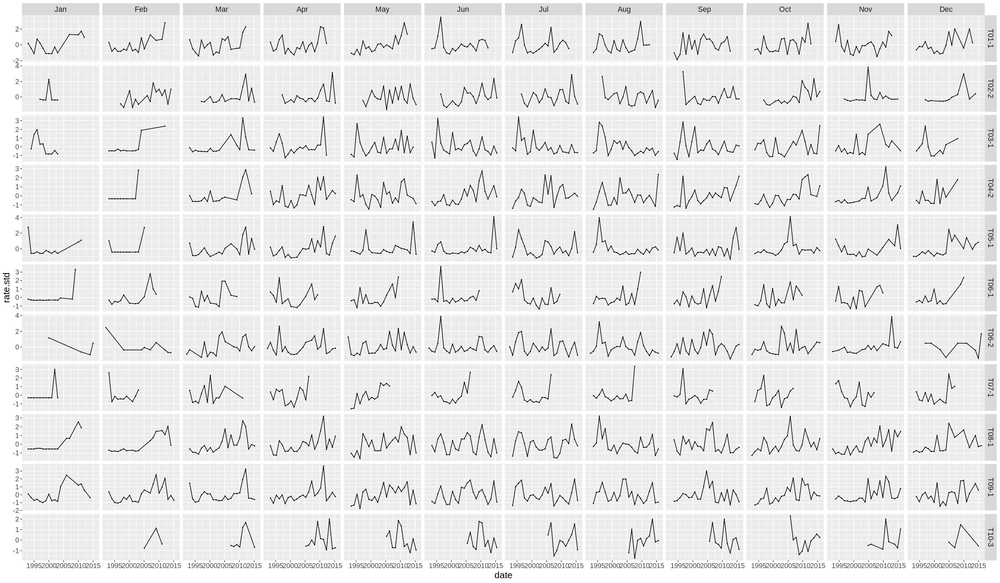

In [18]:
data.mothtrap.monthlyrate.threshold <- data.mothtrap.monthlyrate.threshold %>%
    group_by(TRAPCODE, month) %>%
    mutate(
        rate.avg = mean(rate.monthly),
        rate.deseason = rate.monthly - rate.avg,
        rate.std = rate.deseason/sd(rate.deseason)
    ) %>%
    ungroup()

data.mothtrap.monthlyrate.threshold %>%
    ggplot(aes(x = date, y = rate.std)) +
    geom_point(size = 0.3) +
    geom_line() +
    facet_grid(
        row = vars(TRAPCODE),
        col = vars(month),
        scale = "free_y"
    ) + 
    mytheme

# Univariate changepoint analysis
## Deseasonalised, standardised monthly rate

`summarise()` ungrouping output (override with `.groups` argument)

Warning message:
“Removed 11 rows containing missing values (geom_point).”


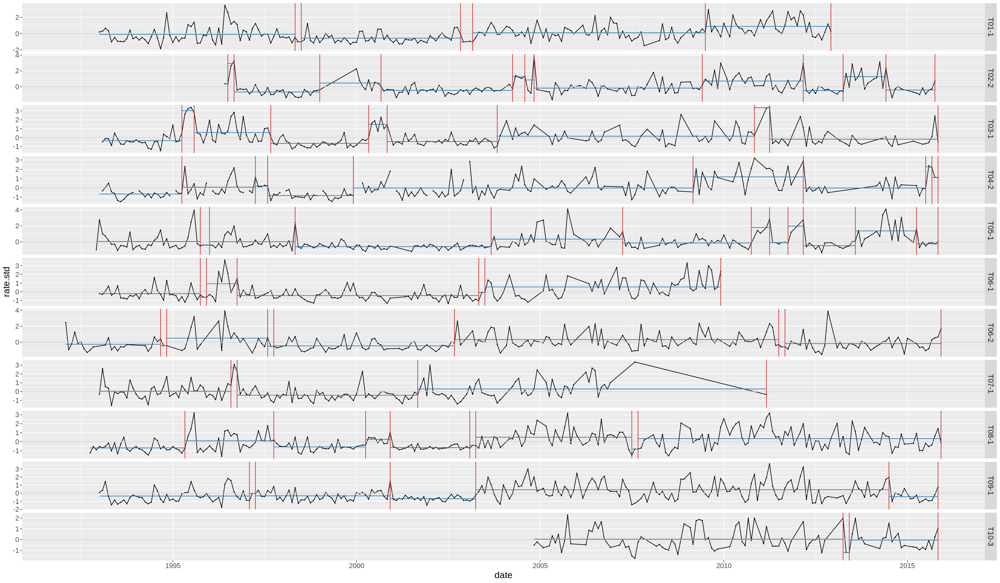

In [19]:
# univariate changepoint analysis
monthlyrate.cpt <- list()
tbl.monthrate.uni.cpts <- 
    tibble::tibble(
        loc = as.Date("1970-01-01"),
        m = as.integer(1),
        TRAPCODE = "t",
        .rows = 0
    )
tbl.monthrate.uni.param <- 
    tibble::tibble(
        loc = as.Date("1970-01-01"),
        m = as.integer(1),
        TRAPCODE = "t",
        type = "t",
        value = 1.0,
        .rows = 0
    )
for( i_trap in 1:length(traps.selected) )
{    
    tmp.cptout <- cpt.msr( 
        data = data.mothtrap.monthlyrate.threshold %>% filter( !is.na(rate.std) ),
        penalty = "bic",
        test.stat = "normal_meanvar",
        key_column = "TRAPCODE",
        key_value = "rate.std",
        key_index = "date",
        keys = traps.selected[i_trap]
    )
    # append changepoint locations
    tbl.monthrate.uni.cpts <- rbind(
        tbl.monthrate.uni.cpts,
        tmp.cptout@msr.cpts %>% mutate(TRAPCODE = traps.selected[i_trap])
    )
    
    # append parameters
    tbl.monthrate.uni.param <- rbind(
        tbl.monthrate.uni.param,
        tmp.cptout@msr.cpts %>%
            dplyr::left_join(
                tmp.cptout@params,
                by = "m"
            ) %>%
            mutate(TRAPCODE = traps.selected[i_trap]) %>%
            select(!id)
        )
    
}

# segment means
tbl.segmeans.uni.param <- tbl.monthrate.uni.param %>%
    filter(type == "mean") %>%
    group_by(TRAPCODE) %>%
    arrange(loc) %>%
    mutate(
        prevloc = lag(loc)
        ) %>%
    ungroup() %>%
    rows_update(
        data.mothtrap.monthlyrate.threshold %>%
            group_by(TRAPCODE) %>%
            summarize(
                prevloc = min(date),
                m = 1
            ) %>%
            ungroup(),
        by = c("TRAPCODE", "m")
    ) %>%
    arrange(TRAPCODE,loc)

data.mothtrap.monthlyrate.threshold %>%
 # plot
    ggplot(aes(x = date, y = rate.std)) +
    geom_line() +
    geom_point(size = 0.3) +
    geom_hline(
        aes(yintercept=0),
        colour = "light gray"
    ) +
    # univariate changpeoints
    geom_vline(
        data = tbl.monthrate.uni.cpts,
        aes(xintercept = loc),
        colour = "#d62728"
    ) + 
    # segment means
    geom_segment(
        data = tbl.segmeans.uni.param,
        aes(x = prevloc, xend = loc, y = value, yend = value),
        colour = "#1f77b4"
    ) +
    facet_grid(
        #col = vars(month),
        row = vars(TRAPCODE),
        scales = "free_y"
    ) +
    mytheme

# Met variables
A good way to determine suitable weather variables may be to compare the smoothed monthly rate with the smoother weather vairbales and seek to identify similarites.
    - Eyeballing smoothed weather and moth rate with a 30 day smoother, gives pretty good correlation with the following variables "ALBGRD", "WSPEED", "DRYTMP", "SOLAR"

# A tibble: 11 x 4
# Groups:   TRAPCODE [11]
  TRAPCODE SITECODE date.min   date.max  
  <chr>    <chr>    <date>     <date>    
1 T06-2    T06      1992-02-25 2015-12-18
2 T08-1    T08      1992-10-23 2015-12-11
3 T05-1    T05      1992-12-11 2015-11-04
4 T04-2    T04      1993-01-02 2015-11-01
5 T01-1    T01      1993-01-03 2012-12-26
# … with 6 more rows


[1] DRYTMP     NETRAD     RAIN       SOLAR      STMP10     STMP30    
 [7] WDIR       WETTMP     WSPEED     ALBGRD     ALBSKY     SURWET    
[13] SWATER     SWATER_T   DRYTMP_RH  RH         SWATER_VWC
17 Levels: DRYTMP NETRAD RAIN SOLAR STMP10 STMP30 WDIR WETTMP WSPEED ... SWATER_VWC

# A tibble: 286,360 x 7
  DATE       FIELDNAME SITECODE    daily TRAPCODE date.min   date.max  
  <date>     <fct>     <chr>       <dbl> <chr>    <date>     <date>    
1 1992-10-23 DRYTMP    T08       5.70    T08-1    1992-10-23 2015-12-11
2 1992-10-23 RAIN      T08       0.00833 T08-1    1992-10-23 2015-12-11
3 1992-10-23 SOLAR     T08      63.2     T08-1    1992-10-23 2015-12-11
4 1992-10-23 ALBGRD    T08      16.9     T08-1    1992-10-23 2015-12-11
5 1992-10-24 DRYTMP    T08       5.29    T08-1    1992-10-23 2015-12-11
# … with 286,355 more rows


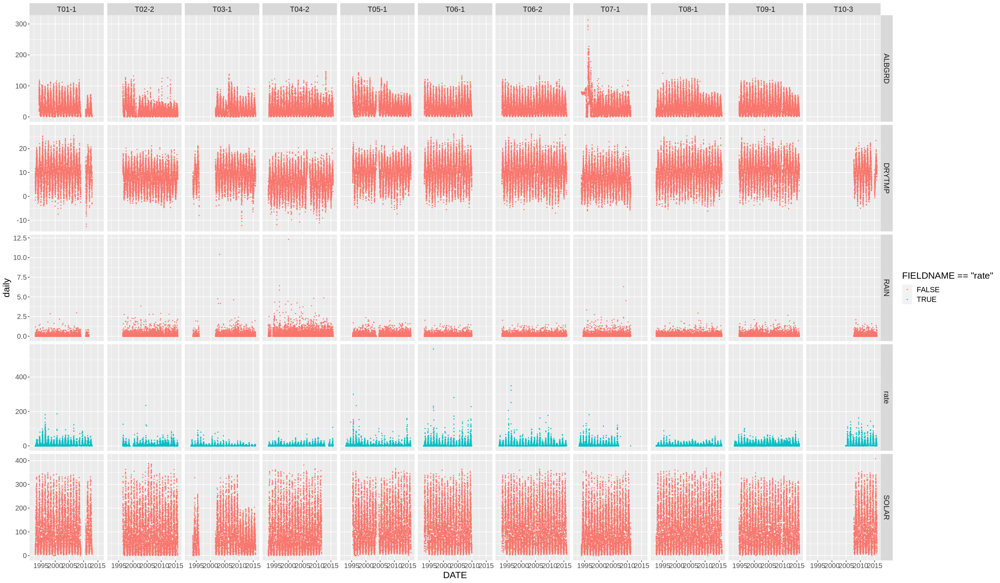

In [20]:
weather.select <- c(
    "ALBGRD", 
    #"WSPEED", 
    "DRYTMP", 
    "SOLAR",
    "RAIN"
)

ssstandardise <- function(x)
    { return( (x - mean(x))/sd(x) ) }
sitecode.from.trapcode <- function(x)
    { return( do.call(c, lapply(strsplit(x, "-"), function(x){ return(x[[1]][1]) })) ) }

inputDataMA = read_feather("/data/ecn/ECNmet_daily.feather")
#inputDataMA = read_feather("ECNmet_daily.feather")
sites <- sort(unique( sitecode.from.trapcode(input.traps$traps) ))

# table of traps with SITECODE, min and max dates
trap.lookup.site <- data.mothtrap.dailyrate.threshold %>%
mutate(
    SITECODE = sitecode.from.trapcode(TRAPCODE)
) %>%
group_by(TRAPCODE) %>%
mutate(
    date.min = min(DATE),
    date.max = max(DATE)
) %>%
select(TRAPCODE, SITECODE, date.min, date.max) %>%
distinct()
print(trap.lookup.site, n = 5)

# names of weather variables
names.weather <- sort(unique(inputDataMA$FIELDNAME))
names.weather

# get weather for each trap
tbl.weather <- inputDataMA %>%
    filter(
        SITECODE %in% sites &
        FIELDNAME %in% weather.select #names.weather[5:8]
    ) %>%
        left_join(
        trap.lookup.site,
        by = "SITECODE"
    ) %>%
    filter(DATE >= date.min & DATE <= date.max)
print(tbl.weather, n = 5)

# join weather and moth rate
data.mothrate.weather <- data.mothtrap.dailyrate.threshold %>%
    tidyr::pivot_longer(
        col = rate,
        names_to = "FIELDNAME",
        values_to = "daily"
    ) %>%
    left_join(
        trap.lookup.site,
        by = "TRAPCODE"
    ) %>%
    select(DATE, FIELDNAME, SITECODE, daily, TRAPCODE) %>%
    full_join(
        tbl.weather %>% select(DATE, FIELDNAME, SITECODE, daily, TRAPCODE), 
        by = c("DATE", "FIELDNAME", "SITECODE", "daily", "TRAPCODE")
    ) 

data.mothrate.weather %>%
    ggplot(aes(x = DATE, y = daily, colour = FIELDNAME == "rate")) +
    geom_point(size = 0.3) +
    #geom_line() +
    facet_grid(
        col = vars(TRAPCODE),
        row = vars(FIELDNAME),
        scales = "free_y"
    ) +
    mytheme

# Smooth daily weather and daily moth rate

Warning message:
“Removed 145 rows containing missing values (geom_point).”
Warning message:
“Removed 29 row(s) containing missing values (geom_path).”


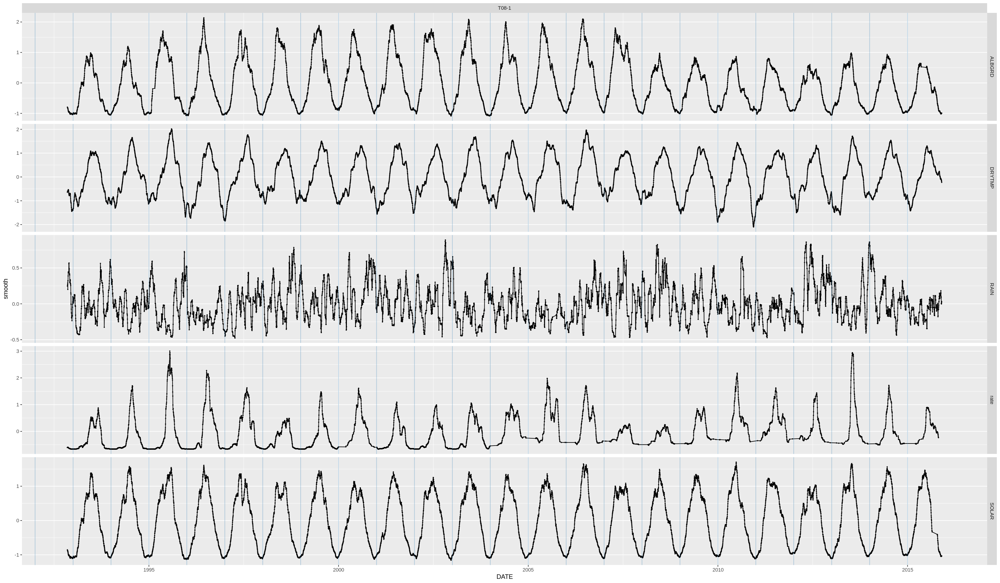

In [21]:
filter.length <- 30
traps.selected <- c("T08-1")

tbl.range.date <- data.mothrate.weather %>% 
summarize(
    year.min = lubridate::year(min(DATE)), 
    year.max = lubridate::year(max(DATE))
) 

data.select <- data.mothrate.weather %>%
    filter( TRAPCODE %in% traps.selected) %>%
    group_by(FIELDNAME, TRAPCODE) %>%
    arrange(DATE) %>%
    mutate(
        daily = ssstandardise(daily),
        smooth = stats::filter(x = daily, filter = rep(1/filter.length, filter.length, method = "convolution"))
    ) %>%
    ungroup() 

data.select %>%
    # plot
    ggplot(aes(x = DATE, y = smooth)) +
    geom_point(size=0.3) +
    geom_line() +
    facet_grid(
        row = vars(FIELDNAME),
        col = vars(TRAPCODE),
        scales = "free_y"
    ) +
    # add year lines
    geom_vline(
        data = data.frame(
            loc = seq(
                from = as.Date(paste0(tbl.range.date$year.min, "-01-01")), 
                to = as.Date(paste0(tbl.range.date$year.max, "-01-01")), 
                by = "1 year"
            )
        ),
        aes(xintercept = loc),
        colour = "#1f77b4",
        alpha = 0.3
    )

`summarise()` regrouping output by 'year', 'month', 'TRAPCODE' (override with `.groups` argument)



[1] "ALBGRD" "DRYTMP" "RAIN"   "rate"   "SOLAR"

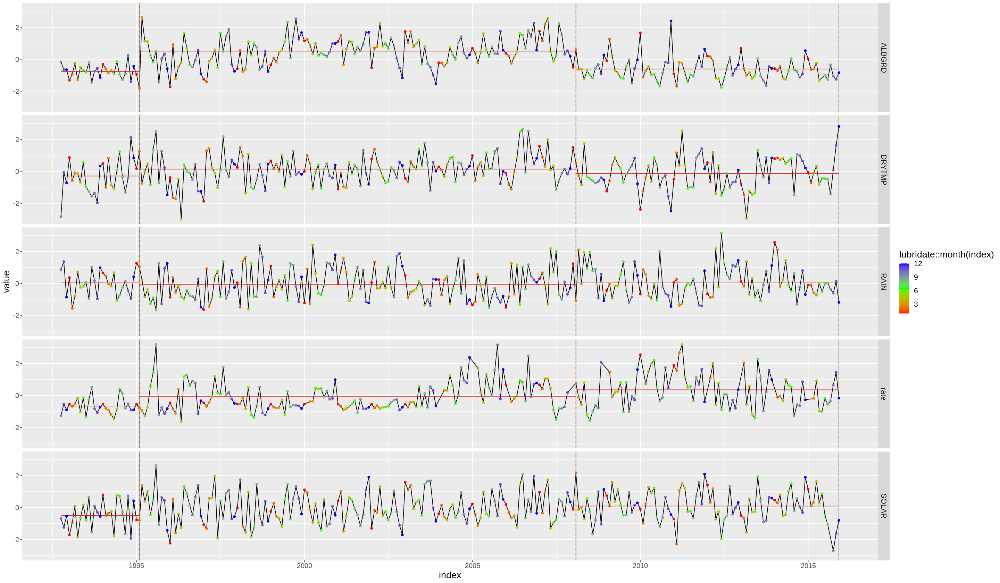

In [22]:
tmp <- data.select %>%
    # agregate to monthly sequence
    mutate( 
        month = lubridate::month(DATE, label=T),
        year = lubridate::year(DATE)
    ) %>%
    # mean monthly values
    group_by(year, month, TRAPCODE, FIELDNAME) %>%
    summarize(rate.month = mean(daily)) %>%
    ungroup() %>%
    # deseasonalise
    group_by(month, TRAPCODE, FIELDNAME) %>%
    mutate(
        rate.std = (rate.month - mean(rate.month))/sd(rate.month)
    ) %>%
    ungroup() %>%
    # add date to first of month
    mutate(
        date = as.Date(paste0(year, "-", month, "-01"), format = "%Y-%B-%d")
    )

# options(repr.plot.width = 24, repr.plot.height = 12)
keys <- sort(unique(tmp$FIELDNAME))
keys
cpt.out <- cpt.msr( 
    data = tmp %>% filter( !is.na(rate.std) ),
    penalty = rep("bic", length(keys)),
    test.stat = rep("normal_meanvar", length(keys)),
    key_column = "FIELDNAME",
    key_value = "rate.std",
    key_index = "date",
    keys = keys
)

plot(cpt.out) +
     geom_point(aes(colour = lubridate::month(index))) +
    scale_color_gradientn(colours = rainbow(3)) + 
    mytheme


# scatter plot of variables

In [23]:
# tmp %>%
#     select(date, FIELDNAME, rate.std) %>%
#     filter(FIELDNAME %in% c("rate", "DRYTMP")) %>%
#     pivot_wider(
#         id_cols = date,
#         names_from = "FIELDNAME",
#         values_from = "rate.std"
#     ) %>%
#     ggplot(aes(x = DRYTMP, y = rate)) +
#     geom_point()


# Difference rate and weather (short interval)
Do changes in the weather coincide with changes in the moth rate

number of consecutive same consecutive values


`summarise()` ungrouping output (override with `.groups` argument)



FIELDNAME,"sum(daily == lag(daily), na.rm = T)"
<chr>,<int>
ALBGRD,6
DRYTMP,4
RAIN,2505
rate,1975
SOLAR,1


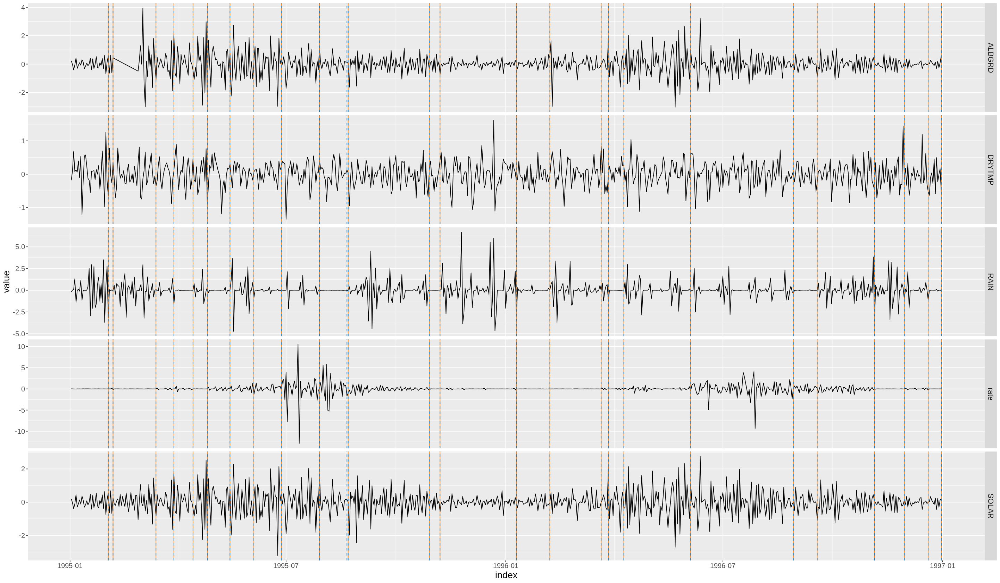

In [24]:
tmp <- data.select %>%
    group_by(FIELDNAME) %>%
    arrange(DATE) %>%
    mutate(
        daily = ssstandardise(daily),
        diff.daily = c(NA, diff(daily)),
        # jitter
        diff.daily = diff.daily + rnorm(n(), mean=0, sd=0.01)
    ) %>%
    ungroup()

cat("number of consecutive same consecutive values\n")
tmp %>%
    group_by(FIELDNAME) %>%
    arrange(DATE) %>%
    summarize( sum(daily == lag(daily), na.rm=T) ) %>%
    ungroup()

keys <- sort(unique(tmp$FIELDNAME))

cpt.out <- cpt.msr( 
    data = tmp %>% filter( !is.na(diff.daily) & DATE > as.Date("1995-01-01") & DATE < as.Date("1997-01-01")),
    penalty = rep("bic", length(keys)),
    test.stat = rep("normal_var", length(keys)),
    key_column = "FIELDNAME",
    key_value = "diff.daily",
    key_index = "DATE",
    keys = keys
)

plot(cpt.out) +
    facet_grid(
        row = vars(key),
        scales = "free_y"
    ) +
    mytheme
    # plot
#     ggplot(aes(x = DATE, y = diff.daily)) +
#     geom_point(size = 0.3) +
#     geom_line() +
#     facet_grid(
#         row = vars(FIELDNAME),
#         scales = "free_y"
#     )

In [25]:
cpt.out

An object of class "cpt.msr"
Slot "time_called":
[1] "2021-07-28 15:11:48 UTC"

Slot "time_complete":
[1] "2021-07-28 15:11:48 UTC"

Slot "data":
# A tibble: 3,608 x 4
   index        value    id key   
   <date>       <dbl> <int> <chr> 
 1 1995-01-02  0.234      1 ALBGRD
 2 1995-01-03 -0.0198     1 ALBGRD
 3 1995-01-04 -0.412      1 ALBGRD
 4 1995-01-05 -0.0574     1 ALBGRD
 5 1995-01-06  0.438      1 ALBGRD
 6 1995-01-07 -0.304      1 ALBGRD
 7 1995-01-08 -0.0735     1 ALBGRD
 8 1995-01-09  0.0954     1 ALBGRD
 9 1995-01-10 -0.0765     1 ALBGRD
10 1995-01-11  0.307      1 ALBGRD
# … with 3,598 more rows

Slot "summary":
# A tibble: 5 x 7
     id key        T cost       minseglen penname penalty
  <int> <chr>  <int> <chr>          <dbl> <chr>     <dbl>
1     1 ALBGRD   710 normal_var         2 bic        13.1
2     2 DRYTMP   730 normal_var         2 bic        13.2
3     3 RAIN     730 normal_var         2 bic        13.2
4     4 rate     708 normal_var         2 bic        13.1
5   